For Pleiades Aircraft Dataset:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


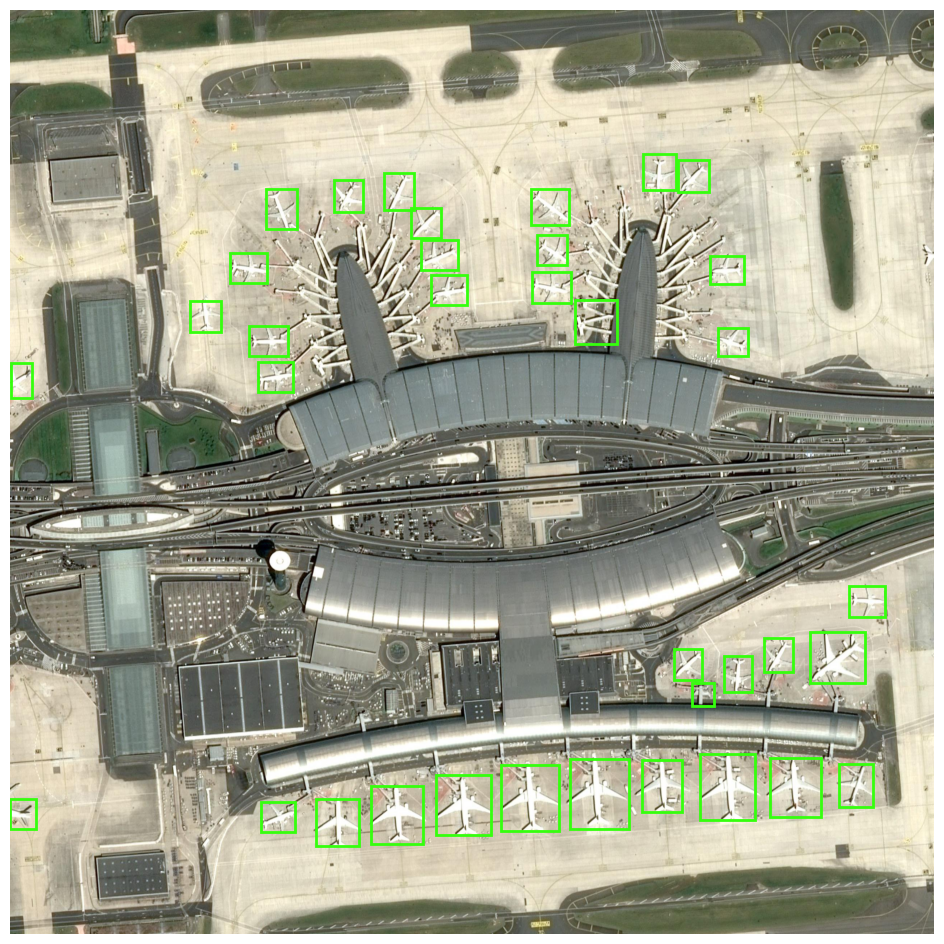

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_Optique/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_Optical_Predicted_Images_Annotated/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg


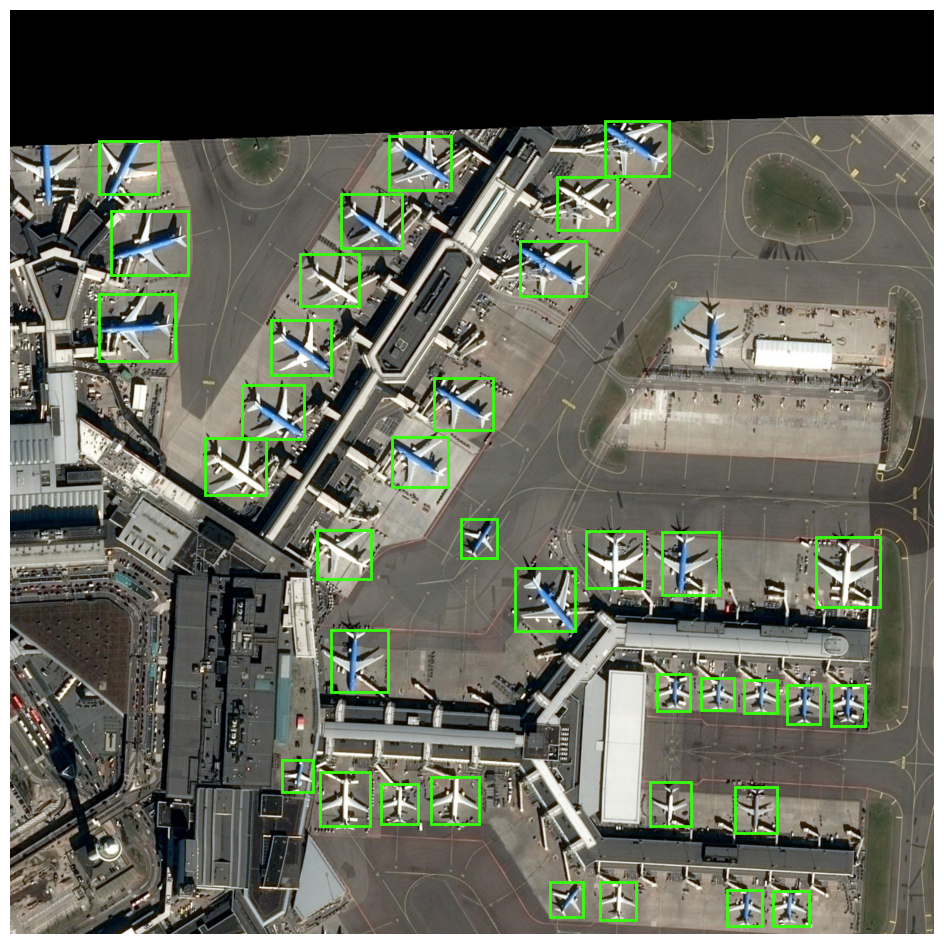

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_Optique/576827bc-a94a-4611-8820-f3d56e969151.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_Optical_Predicted_Images_Annotated/576827bc-a94a-4611-8820-f3d56e969151.jpg


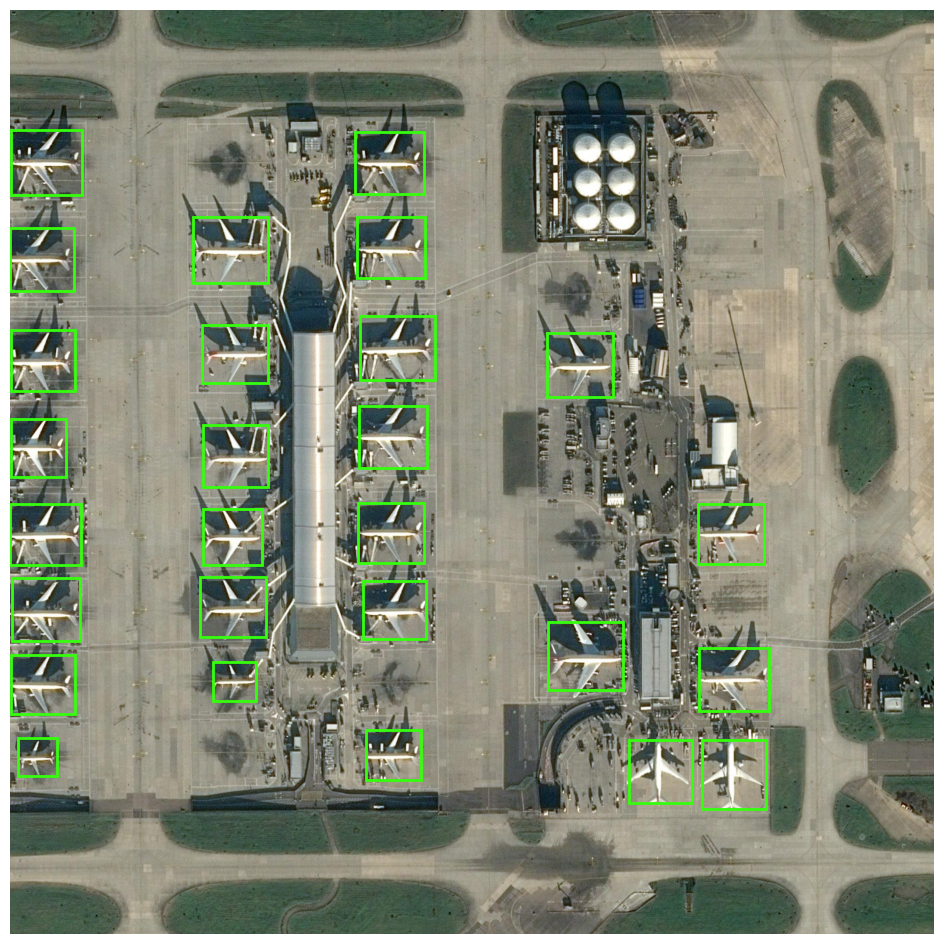

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_Optique/dacabde6-c8a7-475b-ab26-81b4e4dd5977.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_Optical_Predicted_Images_Annotated/dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg


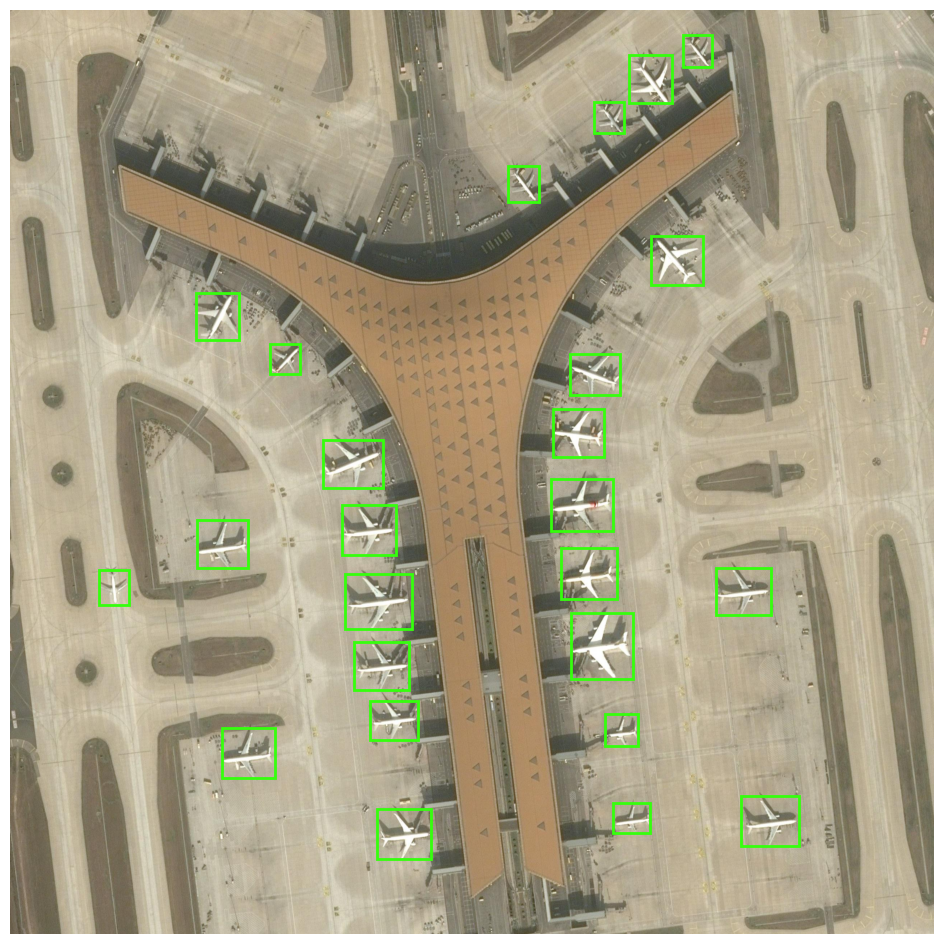

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_Optique/f82d64a6-3bfa-4612-bcbd-847a7d89c296.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_Optical_Predicted_Images_Annotated/f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg


In [2]:
# ✅ 1. Monter le Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Imports nécessaires
import os
import cv2
import json
import torch
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image

# ✅ 3. Préparation des chemins
images_dir = "/content/drive/MyDrive/Predicted_Images/"
output_json_dir = "/content/drive/MyDrive/JSONS_FASTER_R-CNN_Optique/"
annotated_images_dir = "/content/drive/MyDrive/FASTER-RCNN_Optical_Predicted_Images_Annotated/"
os.makedirs(output_json_dir, exist_ok=True)
os.makedirs(annotated_images_dir, exist_ok=True)

model_path = "/content/drive/MyDrive/Pretrained_Custom_Models/fasterrcnn_Optical.pth"

# ✅ 4. Charger le modèle Faster R-CNN
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
model.load_state_dict(torch.load(model_path, map_location='cuda' if torch.cuda.is_available() else 'cpu'))
model.eval().cuda() if torch.cuda.is_available() else model.eval()

# ✅ 5. Définir les catégories
categories = [{"id": 0, "name": "background"},
              {"id": 1, "name": "Airplane"}]

# ✅ 6. Définir la transformation d'entrée
transform = T.Compose([
    T.ToTensor()
])

# ✅ 7. Prédire chaque image, afficher, sauvegarder JSON + Image annotée
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
for image_name in sorted(image_files):
    image_path = os.path.join(images_dir, image_name)
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0)

    with torch.no_grad():
        prediction = model(image_tensor.cuda() if torch.cuda.is_available() else image_tensor)[0]

    img_cv = cv2.imread(image_path)
    height, width = img_cv.shape[:2]
    img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

    boxes = []
    annotations = []
    for i, (bbox, label, score) in enumerate(zip(prediction['boxes'], prediction['labels'], prediction['scores'])):
        if score < 0.4:
            continue
        x_min, y_min, x_max, y_max = bbox.tolist()
        box_w = x_max - x_min
        box_h = y_max - y_min
        label_name = categories[label]["name"] if label < len(categories) else f"class_{label}"
        boxes.append(([x_min, y_min, box_w, box_h], label_name))
        annotations.append({
            "id": i,
            "image_id": 0,
            "category_id": int(label),
            "bbox": [x_min, y_min, box_w, box_h],
            "area": box_w * box_h,
            "iscrowd": 0
        })

    # ✅ Affichage et sauvegarde matplotlib sans axes ni labels
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img_rgb)
    for box, label in boxes:
        x, y, w, h = box
        rect = Rectangle((x, y), w, h, edgecolor='#35ff0d', linewidth=2, facecolor='none')
        ax.add_patch(rect)

    ax.axis('off')           # ✅ Supprime les axes
    ax.set_xticks([])        # ✅ Supprime les ticks en X
    ax.set_yticks([])        # ✅ Supprime les ticks en Y
    ax.set_xticklabels([])   # ✅ Supprime les labels en X
    ax.set_yticklabels([])   # ✅ Supprime les labels en Y

    # 💾 Sauvegarde image annotée
    annotated_path = os.path.join(annotated_images_dir, image_name)
    fig.savefig(annotated_path, bbox_inches='tight', pad_inches=0)

    # 👁️ Affichage dans la console Colab
    plt.show()
    plt.close(fig)

    # ✅ Format COCO pour cette image
    coco_dict = {
        "images": [{
            "id": 0,
            "file_name": image_name,
            "width": width,
            "height": height
        }],
        "annotations": annotations,
        "categories": categories[1:]
    }

    json_filename = os.path.splitext(image_name)[0] + ".json"
    json_path = os.path.join(output_json_dir, json_filename)
    with open(json_path, 'w') as json_file:
        json.dump(coco_dict, json_file, indent=2)

    print(f"✅ JSON COCO sauvegardé : {json_path}")
    print(f"🖼️ Image annotée sauvegardée : {annotated_path}")

For SSDD Dataset:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


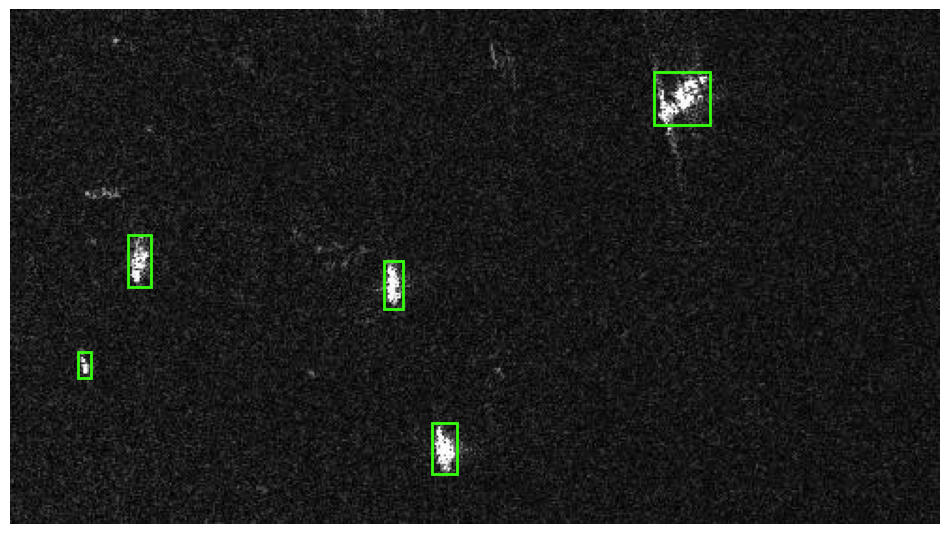

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/000207.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/000207.jpg


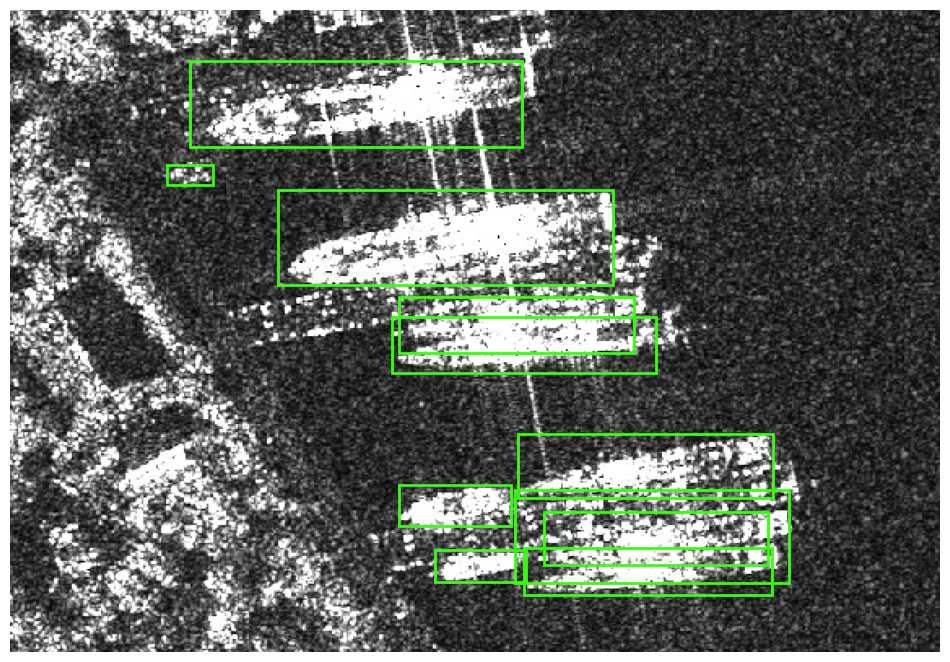

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/000219.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/000219.jpg


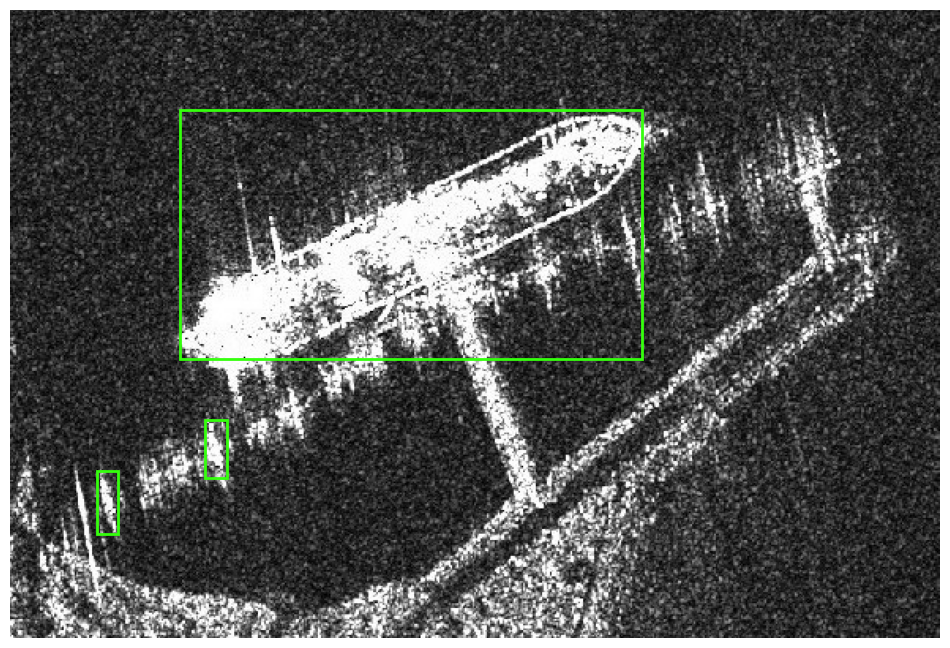

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/000223.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/000223.jpg


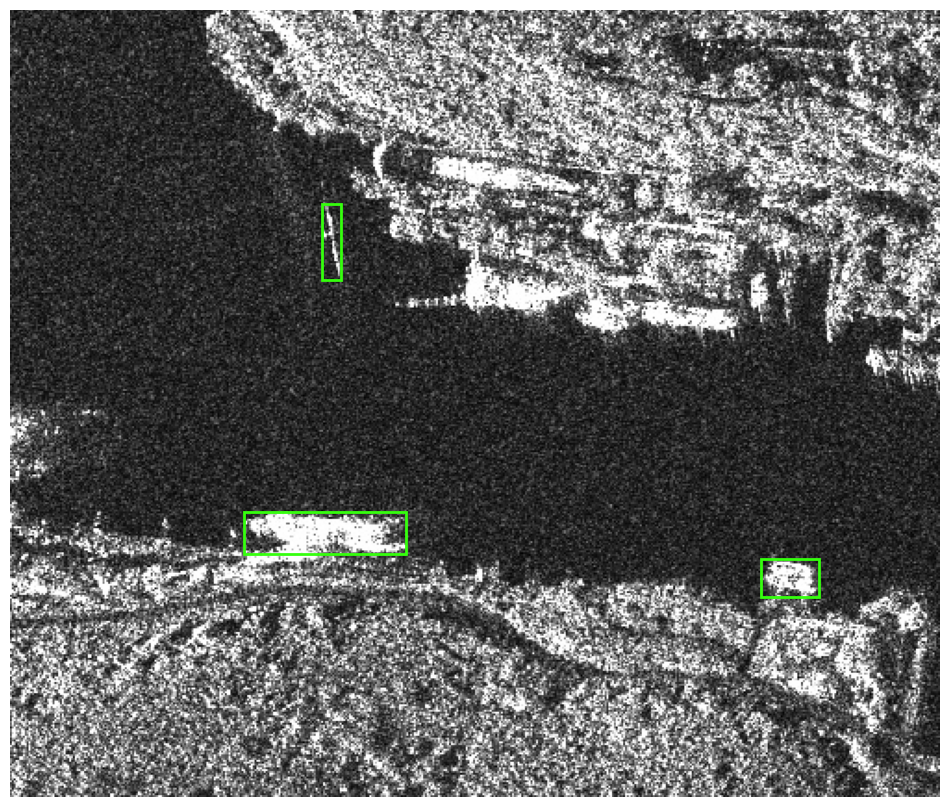

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/000228.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/000228.jpg


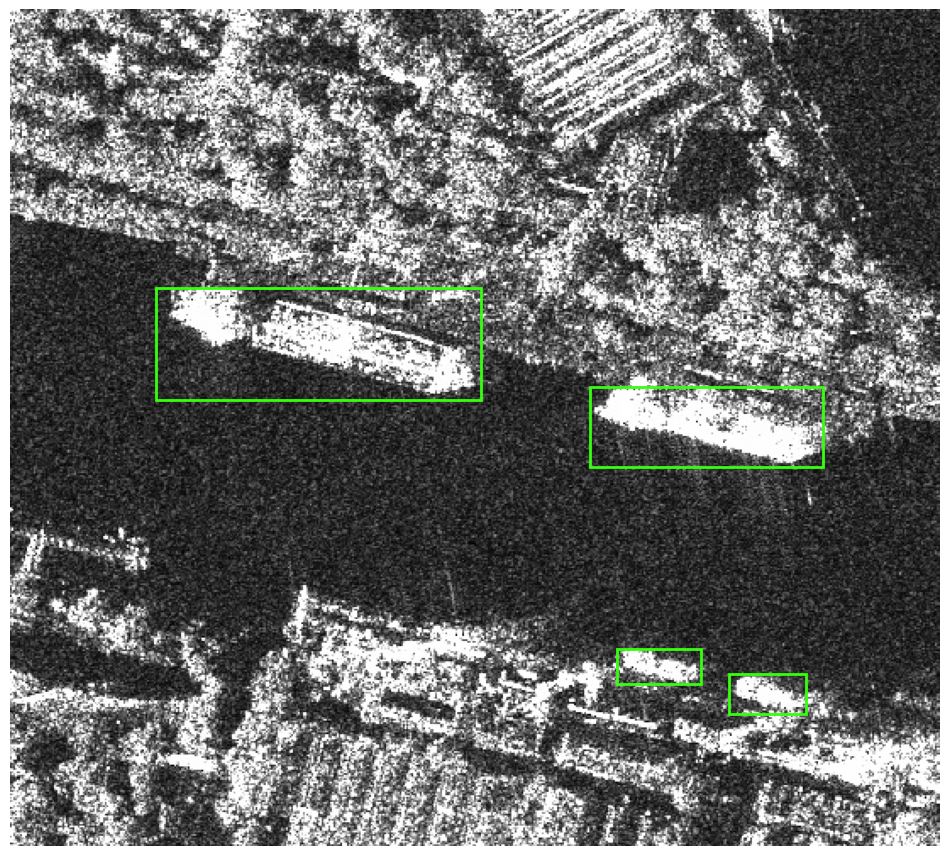

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/000229.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/000229.jpg


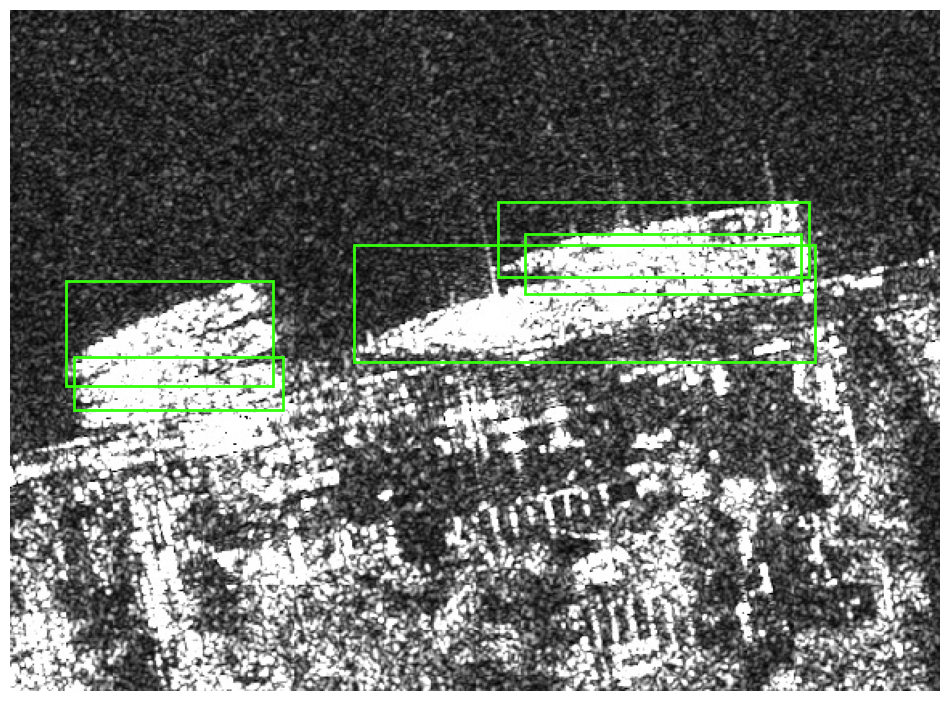

✅ JSON COCO sauvegardé : /content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/000233.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/000233.jpg


In [4]:
# ✅ 1. Monter le Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Imports nécessaires
import os
import cv2
import json
import torch
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image

# ✅ 3. Préparation des chemins
images_dir = "/content/drive/MyDrive/Predicted_SAR_Images/"
output_json_dir = "/content/drive/MyDrive/JSONS_FASTER_R-CNN_SAR/"
annotated_images_dir = "/content/drive/MyDrive/FASTER-RCNN_SAR_Predicted_Images_Annotated/"
os.makedirs(output_json_dir, exist_ok=True)
os.makedirs(annotated_images_dir, exist_ok=True)

model_path = "/content/drive/MyDrive/Pretrained_Custom_Models/fasterrcnn_SAR.pth"

# ✅ 4. Charger le modèle Faster R-CNN
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
model.load_state_dict(torch.load(model_path, map_location='cuda' if torch.cuda.is_available() else 'cpu'))
model.eval().cuda() if torch.cuda.is_available() else model.eval()

# ✅ 5. Définir les catégories
categories = [{"id": 0, "name": "background"},
              {"id": 1, "name": "Ship"}]

# ✅ 6. Définir la transformation d'entrée
transform = T.Compose([
    T.ToTensor()
])

# ✅ 7. Prédire chaque image, afficher, sauvegarder JSON + Image annotée
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
for image_name in sorted(image_files):
    image_path = os.path.join(images_dir, image_name)
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0)

    with torch.no_grad():
        prediction = model(image_tensor.cuda() if torch.cuda.is_available() else image_tensor)[0]

    img_cv = cv2.imread(image_path)
    height, width = img_cv.shape[:2]
    img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

    boxes = []
    annotations = []
    for i, (bbox, label, score) in enumerate(zip(prediction['boxes'], prediction['labels'], prediction['scores'])):
        if score < 0.4:
            continue
        x_min, y_min, x_max, y_max = bbox.tolist()
        box_w = x_max - x_min
        box_h = y_max - y_min
        label_name = categories[label]["name"] if label < len(categories) else f"class_{label}"
        boxes.append(([x_min, y_min, box_w, box_h], label_name))
        annotations.append({
            "id": i,
            "image_id": 0,
            "category_id": int(label),
            "bbox": [x_min, y_min, box_w, box_h],
            "area": box_w * box_h,
            "iscrowd": 0
        })

    # ✅ Affichage et sauvegarde matplotlib (sans axes ni ticks)
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img_rgb)
    for box, label in boxes:
        x, y, w, h = box
        rect = Rectangle((x, y), w, h, edgecolor='#35ff0d', linewidth=2, facecolor='none')
        ax.add_patch(rect)

    ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # 💾 Sauvegarde image annotée
    annotated_path = os.path.join(annotated_images_dir, image_name)
    fig.savefig(annotated_path, bbox_inches='tight', pad_inches=0)

    # 👁️ Affichage dans la console Colab
    plt.show()
    plt.close(fig)

    # ✅ Format COCO pour cette image
    coco_dict = {
        "images": [{
            "id": 0,
            "file_name": image_name,
            "width": width,
            "height": height
        }],
        "annotations": annotations,
        "categories": categories[1:]  # ignorer le background
    }

    json_filename = os.path.splitext(image_name)[0] + ".json"
    json_path = os.path.join(output_json_dir, json_filename)
    with open(json_path, 'w') as json_file:
        json.dump(coco_dict, json_file, indent=2)

    print(f"✅ JSON COCO sauvegardé : {json_path}")
    print(f"🖼️ Image annotée sauvegardée : {annotated_path}")